Explanatory analysis of our dataset 

In [1]:
! pip3 install contextily cartopy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.9/10.9 MB 7.5 MB/s eta 0:00:0000:010:01m
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for cartopy: filename=cartopy-0.21.1-cp38-cp38-macosx_10_9_x86_64.whl size=10795685 sha256=60af96a4294de889bd9c74a252e203438d4b2d13aceeff0ffe33a3c2813f8a94
  Stored in directory: /Users/hereagain/Library/Caches/pip/wheels/7c/ff/6f/09e4aa53f4e67d6498ef1d33dd4ea9c8c165817b9ddcc31d28
Successfully built cartopy


In [2]:
# import modules 
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from shapely.geometry import Point
import cartopy.crs as ccrs
import cartopy.feature as cfeature

In [12]:
import rasterio
import numpy as np
import contextily as ctx
from shapely.geometry import Point
from rasterio.plot import show
from rasterio.enums import Resampling

In [ ]:
directory = '/Users/hereagain/Desktop/OpenAItoZ/dataset/'

In [4]:
train_df = pd.read_csv(directory + 'cleaned_train_all.csv')
train_df.columns

Index(['type', 'longitude', 'latitude', 'NDVI', 'NDBI', 'BSI', 'bio1', 'bio2',
       'bio3', 'bio4', 'bio5', 'bio6', 'bio7', 'bio8', 'bio9', 'bio10',
       'bio11', 'bio12', 'bio13', 'bio14', 'bio15', 'bio16', 'bio17', 'bio18',
       'bio19', 'distriver1', 'distriver2', 'bulk_density', 'slope', 'tri',
       'ph', 'soc', 'clay', 'cec', 'lidar_elevation_value', 'label'],
      dtype='object')

In [5]:
geometry = [Point(xy) for xy in zip(train_df['longitude'],train_df['latitude'])]
gdf = gpd.GeoDataFrame(train_df, geometry=geometry, crs="EPSG:4326")

Download the DEM tif file as map background 

In [22]:
bbox = {
    "south": -13.0,
    "north": -12.0,
    "west": -53.5,
    "east": -52.5
}

xingu = train_df[
    (train_df.latitude >= bbox['south']) & (train_df.latitude <= bbox['north']) &
    (train_df.longitude >= bbox['west']) & (train_df.longitude <= bbox['east'])
]
gdf = gpd.GeoDataFrame(xingu, geometry=gpd.points_from_xy(xingu.longitude, xingu.latitude), crs="EPSG:4326")


In [23]:
from rasterio.warp import transform_bounds

In [25]:
def compute_hillshade(array, azimuth=315, angle_altitude=45):
    azimuth_rad = np.radians(azimuth)
    altitude_rad = np.radians(angle_altitude)
    x, y = np.gradient(array)
    slope = np.pi / 2 - np.arctan(np.hypot(x, y))
    aspect = np.arctan2(-x, y)
    shaded = (np.sin(altitude_rad) * np.sin(slope) +
              np.cos(altitude_rad) * np.cos(slope) * np.cos(azimuth_rad - aspect))
    return 255 * (shaded - shaded.min()) / (shaded.max() - shaded.min())

with rasterio.open("/Users/hereagain/Desktop/OpenAItoZ/output_SRTMGL1.tif") as src:
    dem = src.read(1).astype(float)  
    dem[dem == src.nodata] = np.nan
    bounds = src.bounds
    extent = transform_bounds(src.crs, "EPSG:4326", *bounds)
    hillshade = compute_hillshade(dem)

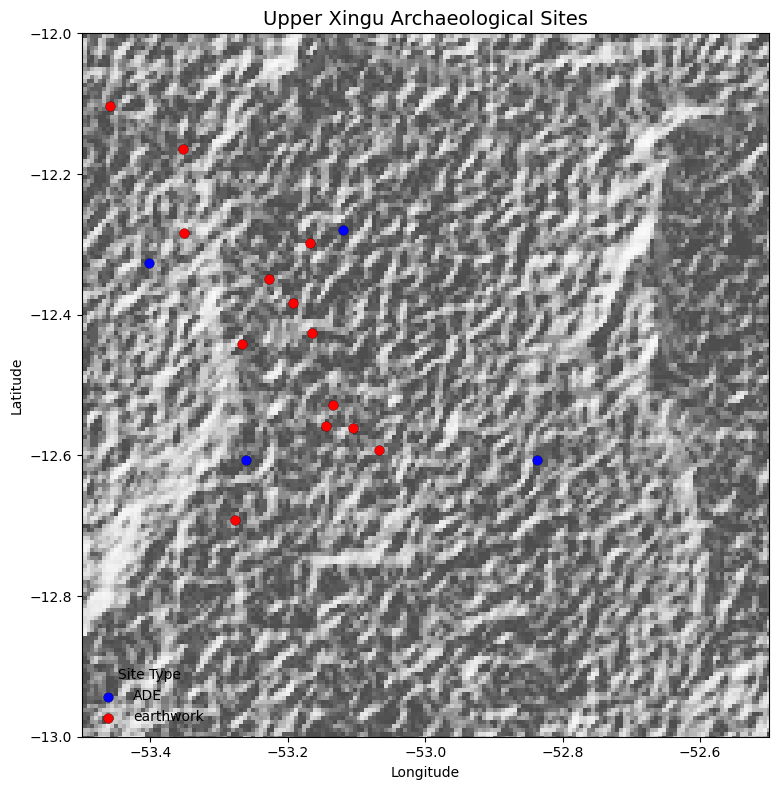

In [ ]:
fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(hillshade, extent=extent, cmap="Greys", alpha=0.7)

# Plot archaeological sites by type
color_map = {"ADE": "blue", "earthwork": "red", "other": "gray"}
for t in gdf['type'].unique():
    gdf[gdf['type'] == t].plot(ax=ax, color=color_map[t], markersize=50,
                               label=t, edgecolor='k', linewidth=0.2)

# Set bounds to zoom in
ax.set_xlim(bbox['west'], bbox['east'])
ax.set_ylim(bbox['south'], bbox['north'])

# Final touches
ax.set_title("Known Upper Xingu Archaeological Sites", fontsize=14)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.legend(title="Site Type", loc="lower left", frameon=False)
plt.tight_layout()
plt.savefig("/Users/hereagain/Desktop/OpenAItoZ/upper_xingu_map.pdf", dpi=600)
plt.show()

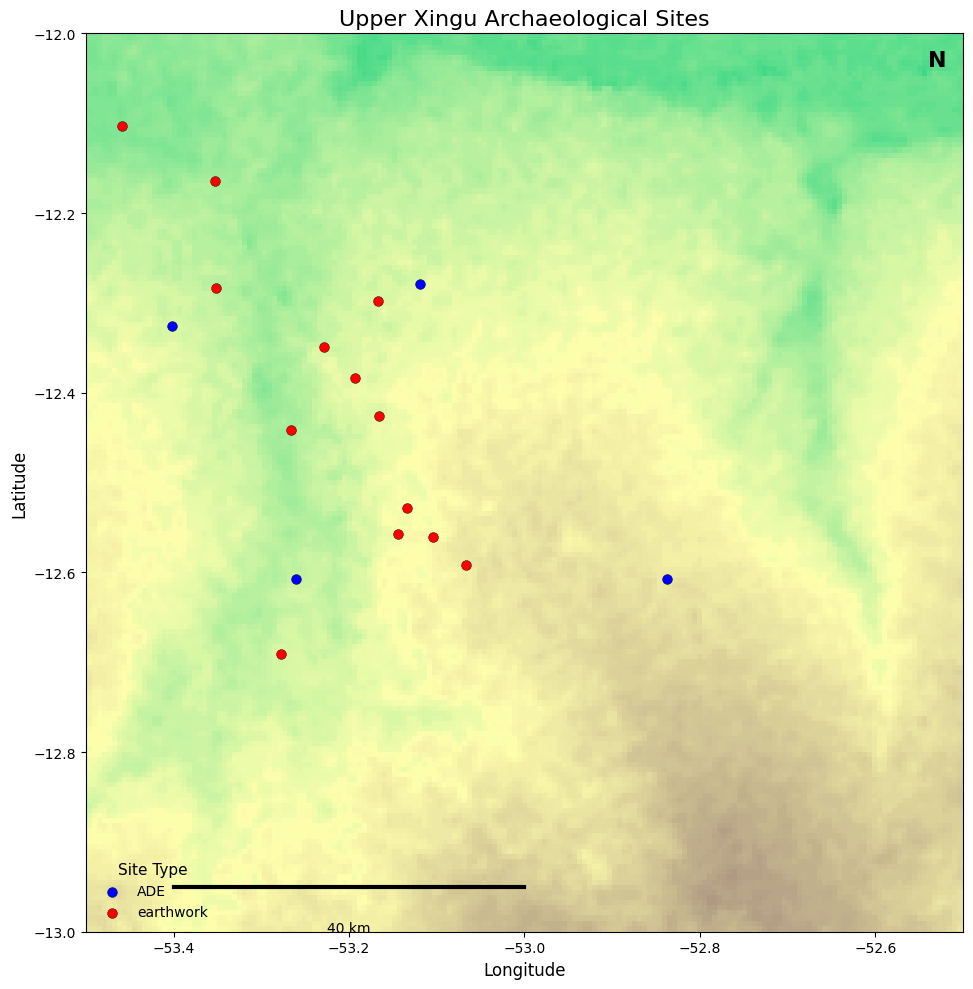

In [30]:
fig, ax = plt.subplots(figsize=(10, 10))

# Terrain-style elevation background
ax.imshow(dem, extent=extent, cmap="terrain", alpha=0.8, zorder=0)

# === Step 5: Plot sites with larger dots and clear colors ===
color_map = {
    "ADE": "blue",
    "earthwork": "red",
    "other": "goldenrod"   # contrast against terrain
}
for t in gdf['type'].unique():
    gdf[gdf['type'] == t].plot(ax=ax, color=color_map[t], markersize=50,
                               label=t, edgecolor='black', linewidth=0.3, zorder=2)

# === Step 6: Style the figure ===
ax.set_xlim(bbox['west'], bbox['east'])
ax.set_ylim(bbox['south'], bbox['north'])
ax.set_title("Upper Xingu Archaeological Sites", fontsize=16)
ax.set_xlabel("Longitude", fontsize=12)
ax.set_ylabel("Latitude", fontsize=12)
ax.legend(title="Site Type", loc="lower left", fontsize=10, title_fontsize=11, frameon=False)
ax.tick_params(labelsize=10)

# === Optional: Add north arrow & scale bar placeholders ===
ax.annotate('N', xy=(0.97, 0.97), xycoords='axes fraction',
            ha='center', va='center', fontsize=16, fontweight='bold',
           arrowprops=dict(facecolor='black', arrowstyle='simple', lw=1.5))
ax.plot([-53.4, -53.0], [-12.95, -12.95], color='black', lw=3)
ax.text(-53.2, -13.0, '40 km', fontsize=10, ha='center')

# === Step 7: Export ===
plt.tight_layout()
plt.savefig("/Users/hereagain/Desktop/OpenAItoZ/upper_xingu_final_map.pdf", dpi=600)
plt.savefig("/Users/hereagain/Desktop/OpenAItoZ/upper_xingu_final_map.png", dpi=600)
plt.show()


Download new DEM tif for Upper Xingu Region

In [37]:
API_KEY = "f98502a1d20f17dac51e485a21be3d81"
import requests
import os 
bbox = {
    "west": -54.2,
    "south": -13,
    "east": -52.5,
    "north": -10.5,
}

# ✅ Construct the URL for Copernicus DEM (30m resolution)
url = (
    "https://portal.opentopography.org/API/globaldem?"
    "demtype=COP30"
    f"&south={bbox['south']}&north={bbox['north']}"
    f"&west={bbox['west']}&east={bbox['east']}"
    "&outputFormat=GTiff"
    f"&API_Key={API_KEY}"
)

# ✅ Make the request and save the file
print("📡 Requesting DEM tile from OpenTopography...")
resp = requests.get(url, stream=True)

if resp.status_code != 200:
    raise Exception("DEM request failed: " + resp.text)

# ✅ Save to Desktop
output_path = os.path.expanduser("~/Desktop/upper_xingu_dem.tif")
with open(output_path, "wb") as f:
    for chunk in resp.iter_content(1024):
        f.write(chunk)

print(f"✅ DEM saved to: {output_path}")

📡 Requesting DEM tile from OpenTopography...
✅ DEM saved to: /Users/hereagain/Desktop/upper_xingu_dem.tif


Text(0, 0.5, 'Latitude')

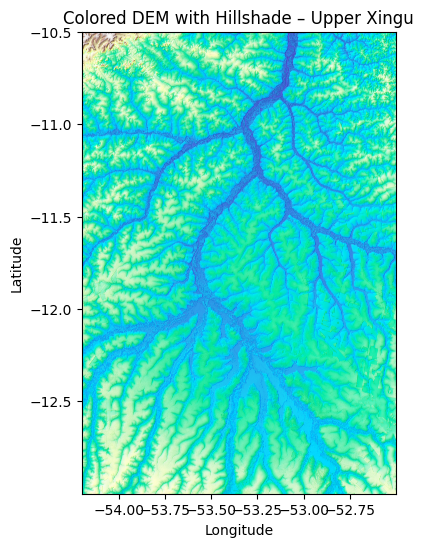

In [39]:
from matplotlib.colors import LightSource
dem_path = "/Users/hereagain/Desktop/upper_xingu_dem.tif"
with rasterio.open(dem_path) as src:
    elevation = src.read(1)
    elevation = np.where(elevation == src.nodata, np.nan, elevation)
    bounds = src.bounds
    extent = [bounds.left, bounds.right, bounds.bottom, bounds.top]

# Optionally add hillshade
ls = LightSource(azdeg=315, altdeg=45)
shaded = ls.shade(elevation, cmap=plt.cm.terrain, blend_mode='overlay', vert_exag=0.5)

# Plot
fig, ax = plt.subplots(figsize=(8, 6))
ax.imshow(shaded, extent=extent)
ax.set_title("Colored DEM with Hillshade – Upper Xingu")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")


/var/folders/3h/5fpgdzf93xd0h56gjvrh5pnw0000gn/T/ipykernel_47047/4044101429.py:37: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


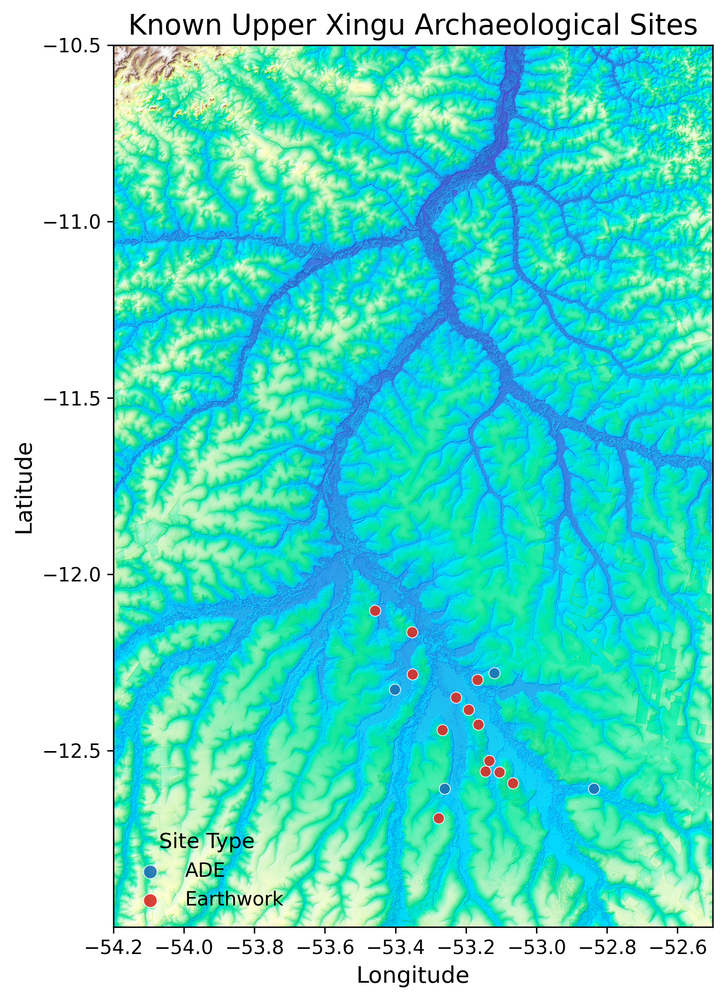

In [41]:
dem_path = "/Users/hereagain/Desktop/upper_xingu_dem.tif"
with rasterio.open(dem_path) as src:
    elevation = src.read(1).astype(float)
    elevation[elevation == src.nodata] = np.nan
    bounds = src.bounds
    extent = [bounds.left, bounds.right, bounds.bottom, bounds.top]

ls = LightSource(azdeg=315, altdeg=45)
shaded = ls.shade(elevation, cmap=plt.cm.terrain, blend_mode='overlay', vert_exag=0.5)

# === Prepare the plot ===
fig, ax = plt.subplots(figsize=(10, 8), dpi=300)
ax.imshow(shaded, extent=extent, zorder=0)

# === Overlay archaeological site points ===
colors = {"ADE": "#2171b5",         # deep blue
          "earthwork": "#de2d26",   # strong red
          "other": "#fdae6b"}       # soft orange (better contrast than gray)
labels = {"ADE": "ADE", "earthwork": "Earthwork", "other": "Other"}

for stype in xingu["type"].unique():
    subset = xingu[xingu["type"] == stype]
    ax.scatter(
        subset["longitude"], subset["latitude"],
        color=colors[stype], label=labels[stype],
        s=40, alpha=0.9, edgecolor="white", linewidth=0.5, zorder=3
    )

# === Formatting and labels ===
ax.set_title("Known Upper Xingu Archaeological Sites", fontsize=16)
ax.set_xlabel("Longitude", fontsize=13)
ax.set_ylabel("Latitude", fontsize=13)
ax.tick_params(labelsize=11)

# === Legend ===
legend = ax.legend(title="Site Type", loc="lower left", fontsize=11, title_fontsize=12, frameon=False)
for handle in legend.legendHandles:
    handle.set_sizes([60])  # Increase dot size in legend

output_dir = "/Users/hereagain/Desktop/OpenAItoZ/figures"
plt.tight_layout()
plt.savefig(f"{output_dir}/upper_xingu_known_sites.pdf", dpi=600, bbox_inches='tight')
plt.savefig(f"{output_dir}/upper_xingu_known_sites.png", dpi=600, bbox_inches='tight')
plt.show()


Add the test site on to the map 

Plot over the river distance in Upper Xingu region 

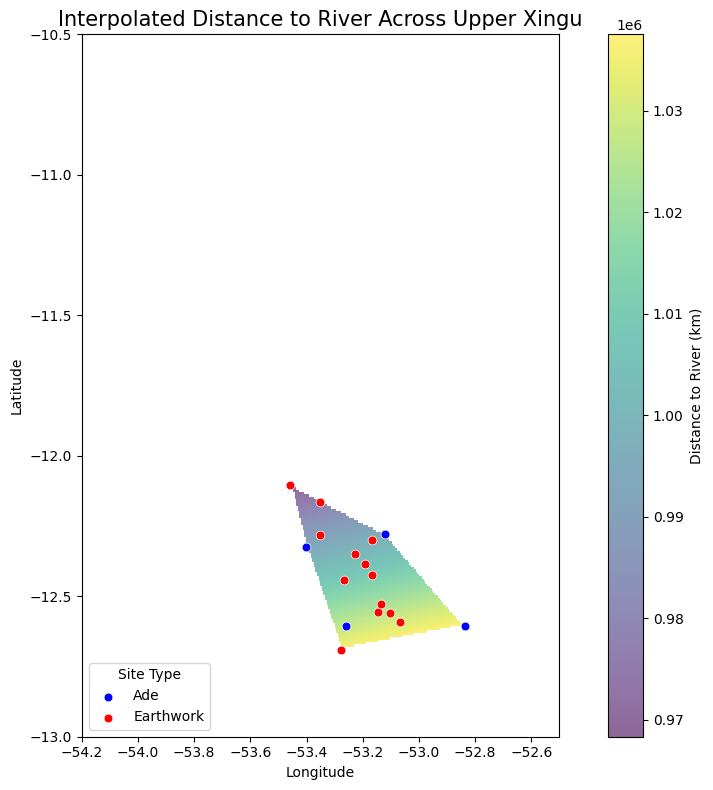

In [43]:
from scipy.interpolate import griddata

# Step 1: Grid
grid_lon = np.linspace(bbox["west"], bbox["east"], 300)
grid_lat = np.linspace(bbox["south"], bbox["north"], 300)
grid_x, grid_y = np.meshgrid(grid_lon, grid_lat)

# Step 2: Interpolation
points = xingu[["longitude", "latitude"]].values
values = xingu["distriver1"].values
grid_z = griddata(points, values, (grid_x, grid_y), method='cubic')


# Step 3: Plot
fig, ax = plt.subplots(figsize=(10, 8))

# Heatmap layer
heatmap = ax.imshow(
    grid_z,
    extent=[bbox["west"], bbox["east"], bbox["south"], bbox["north"]],
    origin="lower",
    cmap="viridis",
    alpha=0.6,
    zorder=1
)

# Optional colorbar
cbar = plt.colorbar(heatmap, ax=ax, label="Distance to River (km)")

# Site type colors
colors = {"ADE": "blue", "earthwork": "red", "other": "gray"}

# Overlay points
for stype in xingu["type"].unique():
    subset =xingu[xingu["type"] == stype]
    ax.scatter(
        subset["longitude"], subset["latitude"],
        color=colors[stype],
        label=stype.capitalize(),
        s=40, edgecolor='white', linewidth=0.5,
        zorder=2
    )

# Map cosmetics
ax.set_title("Interpolated Distance to River Across Upper Xingu", fontsize=15)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.legend(title="Site Type", loc="lower left")
plt.tight_layout()
plt.show()

Take a look at the whole Amazonia region

In [50]:
newbbox = {
    "west": -80.0,
    "east": -45.0,
    "south": -20.0,
    "north": 5.0
}
num_points = 500  # increase for smoother interpolation
grid_lon = np.linspace(newbbox["west"], newbbox["east"], num_points)
grid_lat = np.linspace(newbbox["south"], newbbox["north"], num_points)
grid_x, grid_y = np.meshgrid(grid_lon, grid_lat)

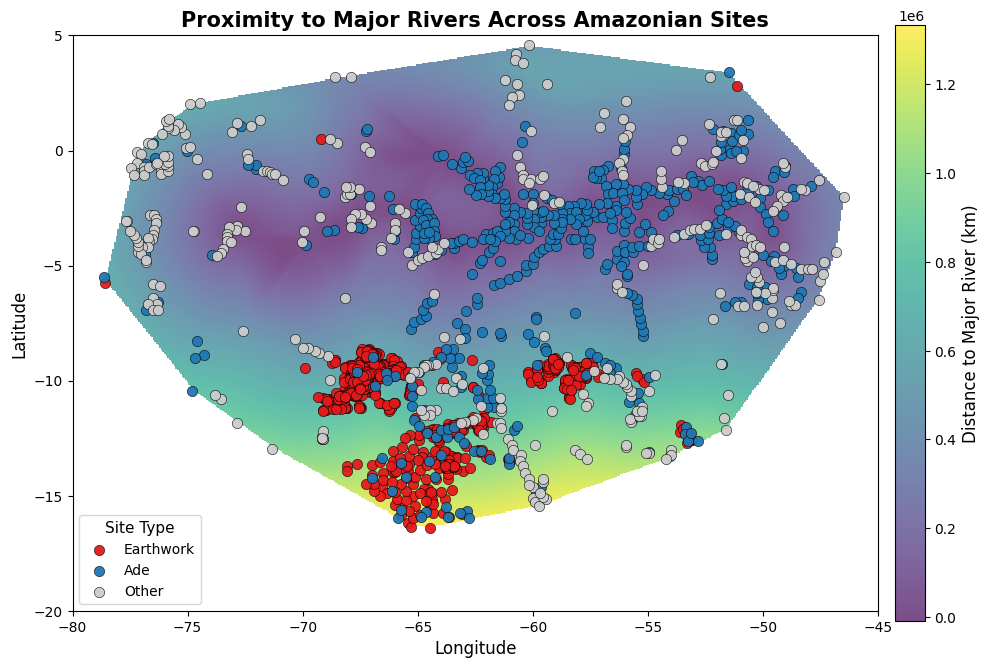

In [52]:

points = train_df[["longitude", "latitude"]].values
values = train_df["distriver1"].values

grid_z = griddata(points, values, (grid_x, grid_y), method="cubic")
fig, ax = plt.subplots(figsize=(10, 8))

# Plot interpolated heatmap
im = ax.imshow(
    grid_z,
    extent=[newbbox["west"], newbbox["east"], newbbox["south"], newbbox["north"]],
    origin="lower",
    cmap="viridis",
    alpha=0.7,
    zorder=1
)

# Add colorbar
cbar = plt.colorbar(im, ax=ax, fraction=0.035, pad=0.02)
cbar.set_label("Distance to Major River (km)", fontsize=12)

# Site type styling
colors = {
    "ADE": "#1f78b4",       # bold blue
    "earthwork": "#e31a1c", # vivid red
    "other": "#cccccc"      # soft gray
}

# Overlay site markers
for stype in train_df["type"].unique():
    subset = train_df[train_df["type"] == stype]
    ax.scatter(
        subset["longitude"], subset["latitude"],
        color=colors.get(stype, "gray"),
        label=stype.capitalize(),
        s=55, alpha=0.95,
        edgecolor="black", linewidth=0.4,
        zorder=2
    )

# Axes and labels
ax.set_title("Proximity to Major Rivers Across Amazonian Sites", fontsize=15, weight="bold")
ax.set_xlabel("Longitude", fontsize=12)
ax.set_ylabel("Latitude", fontsize=12)

# Legend
ax.legend(title="Site Type", loc="lower left", fontsize=10, title_fontsize=11, frameon=True)

# Ticks and aesthetics
ax.tick_params(labelsize=10)
ax.set_aspect("equal", adjustable="box")

# Save as high-res
plt.tight_layout()
plt.savefig(f"{output_dir}/amazon_dist_to_river_map.png", dpi=600, bbox_inches="tight")
plt.savefig(f"{output_dir}/amazon_dist_to_river_map.pdf", dpi=600, bbox_inches="tight")
plt.show()

Color map the bio7 feature, which is the annual temp range

/var/folders/3h/5fpgdzf93xd0h56gjvrh5pnw0000gn/T/ipykernel_47047/1444549596.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="type", y="bio7", data=train_df, palette=["#2171b5", "#de2d26", "#fdae6b"])


Text(0.5, 1.0, 'Temperature Range (Bio7) by Site Type')

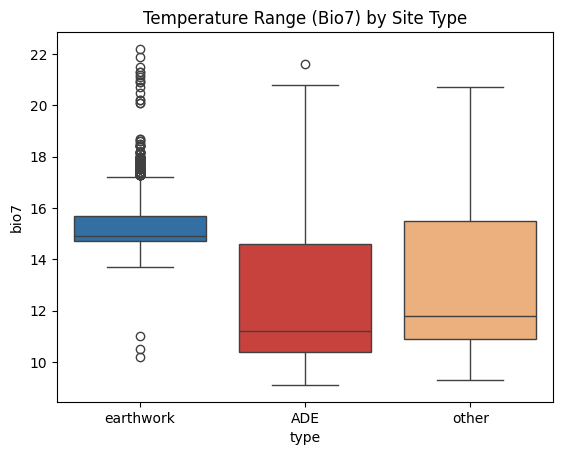

In [56]:
import seaborn as sns

sns.boxplot(x="type", y="bio7", data=train_df, palette=["#2171b5", "#de2d26", "#fdae6b"])
plt.title("Temperature Range (Bio7) by Site Type")

/var/folders/3h/5fpgdzf93xd0h56gjvrh5pnw0000gn/T/ipykernel_47047/262870858.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


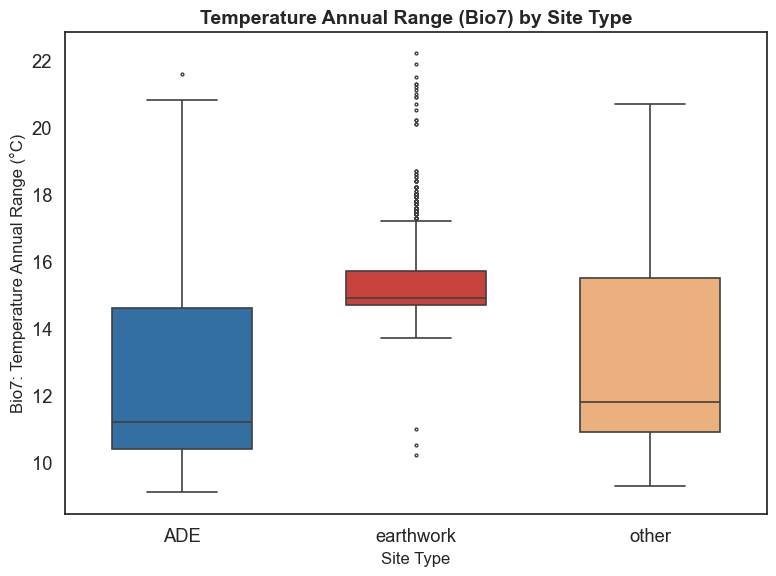

In [61]:
import matplotlib.pyplot as plt
import seaborn as sns




# Define the color palette consistent with your maps
palette = {
    "ADE": "#2171b5",       # deep blue
    "earthwork": "#de2d26", # red
    "other": "#fdae6b"      # soft orange
}

# Order for categorical x-axis (optional but improves consistency)
order = ["ADE", "earthwork", "other"]

# Plot
fig, ax = plt.subplots(figsize=(8, 6))
sns.boxplot(
    x="type", y="bio7", data=train_df,
    palette=palette, order=order,
    width=0.6, linewidth=1.2, fliersize=2, ax=ax
)

# Axis labels and title
ax.set_title("Temperature Annual Range (Bio7) by Site Type", fontsize=14, weight='bold')
ax.set_xlabel("Site Type", fontsize=12)
ax.set_ylabel("Bio7: Temperature Annual Range (°C)", fontsize=12)

# Improve layout and save
plt.tight_layout()
plt.savefig(f"{output_dir}/bio7_by_site_type_boxplot.png", dpi=600, bbox_inches="tight")
plt.savefig(f"{output_dir}/bio7_by_site_type_boxplot.pdf", dpi=600, bbox_inches="tight")
plt.show()


Plot bio19 feature

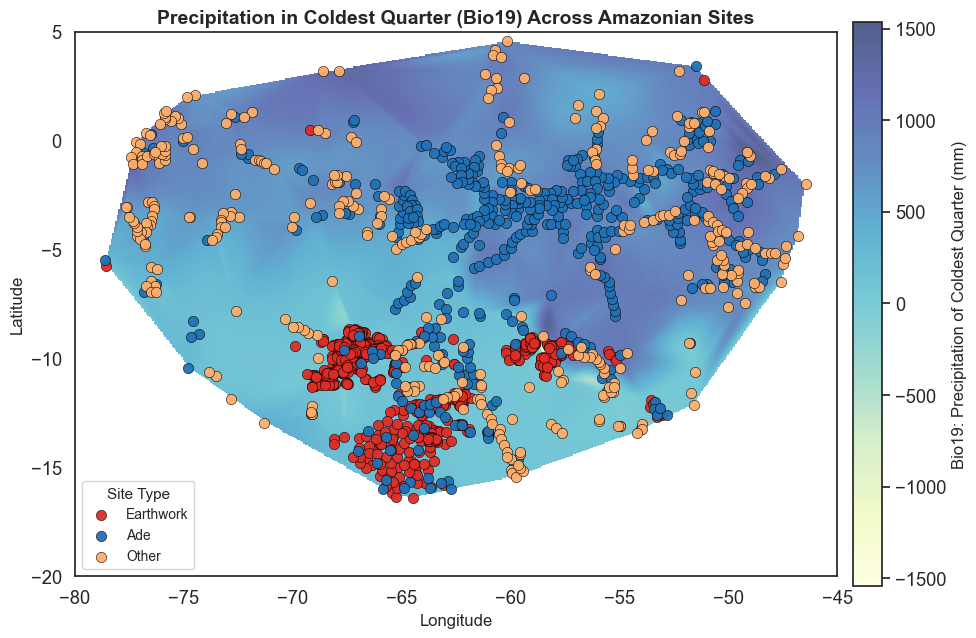

In [59]:
sns.set_theme(style="white", font_scale=1.2)

fig, ax = plt.subplots(figsize=(10, 8))

# Interpolated background
im = ax.imshow(
    grid_z,
    extent=[newbbox["west"], newbbox["east"], newbbox["south"], newbbox["north"]],
    origin="lower",
    cmap="YlGnBu",
    alpha=0.7,
    zorder=1
)

# Colorbar
cbar = plt.colorbar(im, ax=ax, fraction=0.035, pad=0.02)
cbar.set_label("Bio19: Precipitation of Coldest Quarter (mm)", fontsize=12)

# Site type colors
colors = {
    "ADE": "#2171b5",       # dark blue
    "earthwork": "#de2d26", # red
    "other": "#fdae6b"      # light orange
}

# Overlay sites
for stype in train_df["type"].unique():
    subset = train_df[train_df["type"] == stype]
    ax.scatter(
        subset["longitude"], subset["latitude"],
        s=55, alpha=0.95,
        color=colors.get(stype, "gray"),
        label=stype.capitalize(),
        edgecolor="black", linewidth=0.4,
        zorder=2
    )

# Title and labels
ax.set_title("Precipitation in Coldest Quarter (Bio19) Across Amazonian Sites", fontsize=14, weight='bold')
ax.set_xlabel("Longitude", fontsize=12)
ax.set_ylabel("Latitude", fontsize=12)

# Legend
ax.legend(title="Site Type", loc="lower left", fontsize=10, title_fontsize=11, frameon=True)

# Final layout
ax.set_aspect("equal", adjustable="box")
plt.tight_layout()

# Save high-resolution
plt.savefig(f"{output_dir}/bio19_precip_sites_map.png", dpi=600, bbox_inches="tight")
plt.savefig(f"{output_dir}/bio19_precip_sites_map.pdf", dpi=600, bbox_inches="tight")
plt.show()

/var/folders/3h/5fpgdzf93xd0h56gjvrh5pnw0000gn/T/ipykernel_47047/2654125581.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


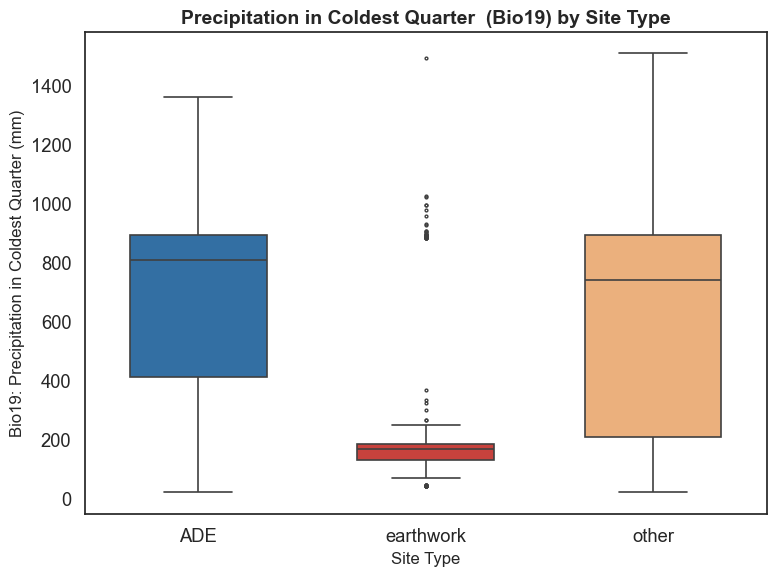

In [60]:
fig, ax = plt.subplots(figsize=(8, 6))
sns.boxplot(
    x="type", y="bio19", data=train_df,
    palette=palette, order=order,
    width=0.6, linewidth=1.2, fliersize=2, ax=ax
)

# Axis labels and title
ax.set_title("Precipitation in Coldest Quarter  (Bio19) by Site Type", fontsize=14, weight='bold')
ax.set_xlabel("Site Type", fontsize=12)
ax.set_ylabel("Bio19: Precipitation in Coldest Quarter (mm)", fontsize=12)

# Improve layout and save
plt.tight_layout()
plt.savefig(f"{output_dir}/bio19_by_site_type_boxplot.png", dpi=600, bbox_inches="tight")
plt.savefig(f"{output_dir}/bio19_by_site_type_boxplot.pdf", dpi=600, bbox_inches="tight")
plt.show()
